# Машинное обучение, ФКН ВШЭ

# Практическое задание 10. Обучение без учителя.

## Общая информация
Дата выдачи: 13.03.2021

Мягкий дедлайн: 28.03.2021 01:59 MSK

Жёсткий дедлайн: 01.04.2021 01:59 MSK

## Оценивание и штрафы

Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). Максимально допустимая оценка за работу — 10 баллов.

Сдавать задание после указанного срока сдачи нельзя. При выставлении неполного балла за задание в связи с наличием ошибок на усмотрение проверяющего предусмотрена возможность исправить работу на указанных в ответном письме условиях.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке.

## Формат сдачи
Задания сдаются через систему anytask. Посылка должна содержать:
* Ноутбук homework-practice-10-Username.ipynb

Username — ваша фамилия на латинице

## О задании

В этом задании мы посмотрим на несколько алгоритмов кластеризации и применим их к географическим и текстовым данным. Также мы подробно остановимся на тематическом моделировании текстов, задаче обучения представлений и в каком-то смысле поработаем с semi-supervised learning. 



In [225]:
import pandas as pd
import numpy as np
from google.colab import files
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans
from sklearn.cluster import SpectralClustering
from sklearn.manifold import TSNE
from sklearn.base import ClusterMixin
from sklearn import preprocessing
import matplotlib.pyplot as plt
from sklearn.decomposition import LatentDirichletAllocation
import collections, re
from sklearn.feature_extraction.text import CountVectorizer
import random
import folium
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

np.random.seed(0xFFFFFFF)

In [259]:
import warnings
warnings.filterwarnings("ignore") 

**Задание 0 (1e-100 балла)**. Опишите свои ощущения от домашки по ЕМ-алгоритму (можно картинкой или мемом).

<img src='https://i.gifer.com/11tv.gif'>

Это я, которая думала, что щас все быстро порешаю, спустя день: 

<img src='https://i.gifer.com/YVgq.gif'>

## Часть 1. Кластеризация автобусных остановок

В этом задании мы сравним разные алгоритмы кластеризации для данных об автобусных остановках Москвы.

**Задание 1.1 (1 балл).** Реализуйте алгоритм спектральной кластеризации, который упоминался на лекции. Для этого разберитесь с кодом шаблона, данного ниже, и допишите недостающую функцию. Напомним, что для графа с матрицей смежности $W = \{w_{ij}\}_{i, j = 1 \dots \ell}$ лапласиан определяется как:

$$
L = D - W,
$$

где $D = \text{diag}(d_1, ..., d_{\ell}), d_i = \sum_{j=1}^{\ell} w_{ij}$.

In [86]:
class GraphClustering(ClusterMixin):
    def __init__(self, n_clusters=8, n_components=None, **kwargs):

        if n_components is None:
            n_components = n_clusters

        self.n_components = n_components
        self.kmeans = KMeans(n_clusters=n_clusters, **kwargs)

    def fit_predict(self, X, y=None):

        eigenvectors = self._generate_eigenvectors(X)
        labels = self.kmeans.fit_predict(eigenvectors[:, 1:])
        return labels

    def _generate_eigenvectors(self, X):
        d_s = np.sum(X, axis=0)
        D = np.diag(d_s)
        L = D - X

        eigenvalues, eigenvectors = np.linalg.eigh(L)
        eigenvectors = eigenvectors[:, :self.n_components]

        return eigenvectors

Перед тем, как переходить к следующему заданию, протестируйте свое решение.

In [88]:
n_blocks, n_vertices = 10, 1000
block_vertices = n_vertices // n_blocks

X = np.zeros((n_vertices, n_vertices))
for i in range(0, n_vertices, block_vertices):
    X[i:i + block_vertices, i:i + block_vertices] = np.sqrt(i + 1)

graph_clustering = GraphClustering(n_clusters=n_blocks)
labels = graph_clustering.fit_predict(X)

true_labels = np.zeros(n_vertices, dtype=np.int32)
for i in range(0, n_vertices, block_vertices):
    true_labels[i:i + block_vertices] = labels[i]

assert labels.shape == (n_vertices, )
assert np.all(np.bincount(labels) == np.full(n_blocks, block_vertices))
assert np.all(labels == true_labels)

УРА

Теперь можем приступить к работе с реальными данными. Скачайте файл с данными об остановках общественного транспорта **в формате .xlsx** по [ссылке](https://data.mos.ru/opendata/download/60464/1/201) (так гарантированно не возникнет проблем с парсингом файла) и загрузите таблицу в ноутбук. Если вдруг сайт Правительства Москвы сойдет с ума, то возьмите какую-нибудь версию данных [отсюда](https://data.mos.ru/opendata/7704786030-city-surface-public-transport-stops). Для удобства визуализации мы будем работать только с остановками в ЦАО.

In [89]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [616]:
data = pd.read_excel('/content/gdrive/My Drive/transport.xlsx')
data = data[data.AdmArea_en == "Czentral`ny'j administrativny'j okrug"]
data = data.reset_index()
data.head()

,index,ID_en,Name_en,Longitude_WGS84_en,Latitude_WGS84_en,Street_en,AdmArea_en,District_en,RouteNumbers_en,StationName_en,Direction_en,Pavilion_en,OperatingOrgName_en,EntryState_en,global_id,geoData
0,278,347,"«2-й Лесной пер.», улица Бутырский Вал (347)",37.586584,55.782106,улица Бутырский Вал,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ18; А12; АТ56; АТ78,2-й Лесной пер.,NaN,да,ГУП «Мосгортранс»,active,889085436,NaN
1,279,349,"«Ул. Сущевский Вал», Новослободская улица (349)",37.590714,55.790630,Новослободская улица,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ47; АМ10; АТ3; АТ56; АТ78,Ул. Сущевский Вал,NaN,да,ГУП «Мосгортранс»,active,889085437,NaN
2,355,479,"«Стадион Лужники (южн.) (пос.)», улица Лужники...",37.565972,55.714265,улица Лужники,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Стадион Лужники (южн.) (пос.),NaN,да,ГУП «Мосгортранс»,active,889085549,NaN
3,356,480,"«Спортзал Дружба», Лужнецкая набережная (480)",37.570191,55.712504,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Спортзал Дружба,NaN,да,ГУП «Мосгортранс»,active,889085550,NaN
4,357,481,"«Лужнецкая наб.», Лужнецкая набережная (481)",37.574559,55.713770,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Лужнецкая наб.,NaN,да,ГУП «Мосгортранс»,active,889085551,NaN


Воспользуемся библиотекой `folium` для визуализации данных.

In [91]:

map = folium.Map([55.75215, 37.61819], zoom_start=12)
for id, row in data.iterrows():
    folium.Circle([row.Latitude_WGS84_en, row.Longitude_WGS84_en],
                  radius=10).add_to(map)
map

**Задание 1.2 (1 балл).** Попробуем построить граф, в котором вершинами будут остановки. Как вы уже могли заметить, для каждой остановки указаны номера маршрутов, проходящих через неё. Логично соединить ребрами соседние остановки каждого маршрута. Однако мы не знаем, в каком порядке автобусы объезжают остановки. Но мы можем применить эвристический алгоритм, который восстановит нам порядок маршрутов:

* Для каждого маршрута выделим список всех остановок, через которые он проходит.
* Выберем начальную остановку маршрута как точку, наиболее удаленную от всех остальных остановок этого маршрута.
* Каждую следующую точку маршрута будем выбирать как самую близкую из оставшихся точек (не включенных в маршрут ранее).

Фактически, у нас получается жадное решение задачи коммивояжера. Когда мы отсортировали маршруты, можем построить по ним граф. Будем строить его по таким правилам:

* Между двумя остановками будет ребро, если они являются соседними хотя бы на одном маршруте. Вес ребра равен числу маршрутов, на которых остановки являются соседними.
* В графе не будет петель (то есть у матрицы смежности будет нулевая диагональ).

Реализуйте предложенный способ построения графа. Для этого рекомендуется воспользоваться шаблонами, приведенными ниже.

In [400]:
def haversine(lat1, lng1, lat2, lng2):
    lat1, lng1, lat2, lng2 = np.radians(lat1), np.radians(lng1), np.radians(lat2), np.radians(lng2)
    AVG_EARTH_RADIUS = 6371
    lat = lat2 - lat1
    lng = lng2 - lng1
    d = np.sin(lat * 0.5) ** 2 + np.cos(lat1) * np.cos(lat2) * np.sin(lng * 0.5) ** 2
    h = 2 * AVG_EARTH_RADIUS * np.arcsin(np.sqrt(d))
    return h

In [521]:
def get_routes(data):
    routes = {}

    for st in data.index:
        for r in (data.loc[st, 'RouteNumbers_en']).split('; '):
            if r not in routes:
                routes.update({r: []})
            routes[r].append(st)

    return routes

def sort_routes(data, routes):
    sorted_routes = {}
    for r in routes:
        cur_st = routes[r]
        cur_size = len(cur_st)
        dist_matrix = np.zeros([cur_size, cur_size])
        for i in range(data.shape[0]):
            for j in range(i + 1, cur_size):
                cur_dist = haversine(data.loc[cur_st[i], 'Latitude_WGS84_en'], data.loc[cur_st[i], 'Longitude_WGS84_en'],
                                     data.loc[cur_st[j], 'Latitude_WGS84_en'], data.loc[cur_st[j], 'Longitude_WGS84_en'])

                dist_matrix[i, j] = cur_dist
                dist_matrix[j, i] = cur_dist

        dist_matrix_2 = dist_matrix.copy()
        prev = np.inf
        cur_st_sort = []
        for k in range(cur_size):
            if k == 0:  #добавляем первую точку маршрута
                prev = np.argmax(np.sum(dist_matrix_2, axis=1))
                cur_st_sort.append(prev)
                for i in range(cur_size):
                    dist_matrix_2[i, i] = np.inf

            else:
                for i in np.argsort(dist_matrix_2[prev, :]):
                    if i not in cur_st_sort:
                        break
                prev = i
                cur_st_sort.append(prev)
        sorted_stops = [cur_st[v] for v in cur_st_sort]
        sorted_routes[r] = sorted_stops

    return sorted_routes

def get_adjacency_matrix(data, sorted_routes):
    adj_matrix = np.zeros([data.shape[0], data.shape[0]])
    for r in sorted_routes:
        cur_stop = sorted_routes[r]
        for i in range(len(cur_stop) - 1):
            adj_matrix[cur_stop[i], cur_stop[i + 1]] += 1
            adj_matrix[cur_stop[i + 1], cur_stop[i]] = adj_matrix[cur_stop[i], cur_stop[i + 1]]

    return adj_matrix

In [617]:
routes = get_routes(data)
sorted_routes = sort_routes(data, routes)
adjacency_matrix = get_adjacency_matrix(data, sorted_routes)

Проверим, что маршруты получились адекватными. Для этого нарисуем их на карте.

In [618]:
map = folium.Map([55.75215, 37.61819], zoom_start=12)
for route_id in np.random.choice(list(sorted_routes.keys()), size=5):
    coords = data.loc[
        sorted_routes[route_id],
        ['Latitude_WGS84_en', 'Longitude_WGS84_en']
    ].values.tolist()
    folium.vector_layers.PolyLine(coords).add_to(map)

map

**Задание 1.3 (0 баллов)**. Реализуйте функцию `draw_clustered_map`, которая рисует карту центра Москвы с кластерами остановок, раскрашенными в разные цвета.

In [115]:
def draw_clustered_map(data, labels):
    colors = []

    for i in range(len(np.unique(labels))):
        colors.append('#%06X' % random.randint(0, 0xFFFFFF))

    map = folium.Map([55.75215, 37.61819], zoom_start=12)
    for id, row in data.iterrows():
        col = colors[labels[id] - 1]
        folium.CircleMarker(location=[row.Latitude_WGS84_en, row.Longitude_WGS84_en], fill_color=col, fill_opacity = 1).add_to(map)
    return map

**Задание 1.4 (1.5 балла)**. Примените алгоритмы кластеризации K-Means и DBSCAN из `sklearn` на координатах остановок, а также свою реализацию спектральной кластеризации на построенной выше матрице смежности. Визуализируйте результат кластеризации с помощью функции `draw_clustered_map`. Подберите параметры алгоритмов (`n_clusters` у K-Means, `eps` у DBSCAN, `n_clusters` и `n_components` у спектральной кластеризации) так, чтобы получить наиболее характерный для этих алгоритмов результат кластеризации (можете поэкспериментировать и оставить в ноутбуке картинки только для итоговых значений параметров, также обратите внимание на баланс объектов в кластерах). Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).

In [517]:
clust_sp = GraphClustering(n_clusters=10).fit_predict(adjacency_matrix)
clust_km = KMeans(n_clusters=5).fit_predict(data[['Longitude_WGS84_en', 'Latitude_WGS84_en']])
clust_db = DBSCAN(eps=0.004).fit(data[['Longitude_WGS84_en', 'Latitude_WGS84_en']]).labels_

In [513]:
draw_clustered_map(data, clust_sp)

In [491]:
draw_clustered_map(data, clust_km)

In [518]:
draw_clustered_map(data, clust_db)

Проинтерпретируйте полученные результаты. Чем отличаются разбиения на кластеры, получаемые разными алгоритмами? Какие плюсы и минусы есть у каждого алгоритма? Какой алгоритм кажется вам наиболее подходящим для кластеризации остановок?

**Ответ:**

Ну, разбиение, полученное при помощи KMeans на малом количестве кластеров в целом ничего, кластеры вышли +- сбалансированными. Как мы знаем, KMeans минимизирует внутрикластерное расстояние. Поэтому и кластеры у него вышли каждый сконцентрирован на своем месте, без особых выбросов. Но при этом мы можем заметить, что кластеры у нас вышли сферической формы, что не всегда соотносится с жизнью. 

Чего не скажешь про DBSCAN, у которого вышли дикие проблемы с балансом кластеров при малом числе кластеров. DBSCAN основан на плотности расположения объектов. Так что так как остановки в Москве находятся все примерно с одной плотностью, при маленьком количестве кластеров возникали некоторые проблемы с балансом классов. Также DBSCAN выделяет кластеры абсолютно любой формы, что довольно хорошо видно на нашей карте. 

Спектральная кластеризация по сути, является обычной кластеризацией KMeans поверх эмбеддингов объектов, которые получаются из лапласиана графа. Так что с ней почти все то же, что с KMeans.  Но основным её минусом является то, что алгоритм работает довольно долго по сравнению со всеми остальными.

Наиболее подходящим для кластеризации остановок кажется спектральная кластеризация, если говорить конкретно о нашем случае, где данных не так много. При увеличении количества данных работать с данным алгоритмом будет уже более напряжно. 

## Часть 2. Тематическое моделирование текстов

В этой части мы познакомимся с одной из самых популярных задач обучения без учителя &mdash; с задачей тематического моделирования текстов. Допустим, нам доступна некоторая коллекция документов без разметки, и мы хотим автоматически выделить несколько тем, которые встречаются в документах, а также присвоить каждому документу одну (или несколько) тем. Фактически, мы будем решать задачу, похожую на кластеризацию текстов: отличие в том, что нас будет интересовать не только разбиение текстов на группы, но и выделение ключевых слов, определяющих каждую тему.

Мы будем работать с новостными статьями BBC за 2004-2005 годы. Скачайте данные по [ссылке](https://www.kaggle.com/hgultekin/bbcnewsarchive).

In [526]:
data = pd.read_csv('/content/gdrive/My Drive/bbc-news-data.csv', sep='\t')
data.sample(5)

,category,filename,title,content
583,entertainment,074.txt,Ocean's Twelve raids box office,"Ocean's Twelve, the crime caper sequel starri..."
91,business,092.txt,Iranian MPs threaten mobile deal,Turkey's biggest private mobile firm could ba...
376,business,377.txt,VW considers opening Indian plant,Volkswagen is considering building a car fact...
1760,sport,448.txt,Kuznetsova 'failed a drugs test',US Open champion Svetlana Kuznetsova has test...
1252,politics,357.txt,Cabinet anger at Brown cash raid,Ministers are unhappy about plans to use Whit...


Как вы могли заметить, данные уже содержат разметку по тематике (колонка category). В этой части мы забудем, что она есть, и будем работать только с текстовыми данными. Проведем предобработку текста, состоящую из следующих пунктов:

* Объединим заголовок и содержание статьи в одно поле.
* Приведем текст к нижнему регистру, разобьем его на токены.
* Оставим только буквенные слова (удалив, таким образом, пунктуацию и числа).
* Применим лемматизацию.
* Удалим стоп-слова.


In [126]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

In [527]:
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

stop_words = set(stopwords.words('english') + ['ha', 'wa', 'say', 'said'])
lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [528]:
def preprocess(text):
    text = list(filter(str.isalpha, word_tokenize(text.lower())))
    text = list(lemmatizer.lemmatize(word) for word in text)
    text = list(word for word in text if word not in stop_words)
    return ' '.join(text)

In [529]:
data['raw_text'] = data.apply(lambda row: row.title + row.content, axis=1)
data['text'] = data.apply(lambda row: preprocess(row.raw_text), axis=1)

Для визуализации частот слов в текстах мы будем использовать [облака тегов](https://en.wikipedia.org/wiki/Tag_cloud).

In [530]:
from wordcloud import WordCloud

def draw_wordcloud(texts, max_words=1000, width=1000, height=500):
    wordcloud = WordCloud(background_color='white', max_words=max_words,
                          width=width, height=height)
    
    joint_texts = ' '.join(list(texts))
    wordcloud.generate(joint_texts)
    return wordcloud.to_image()

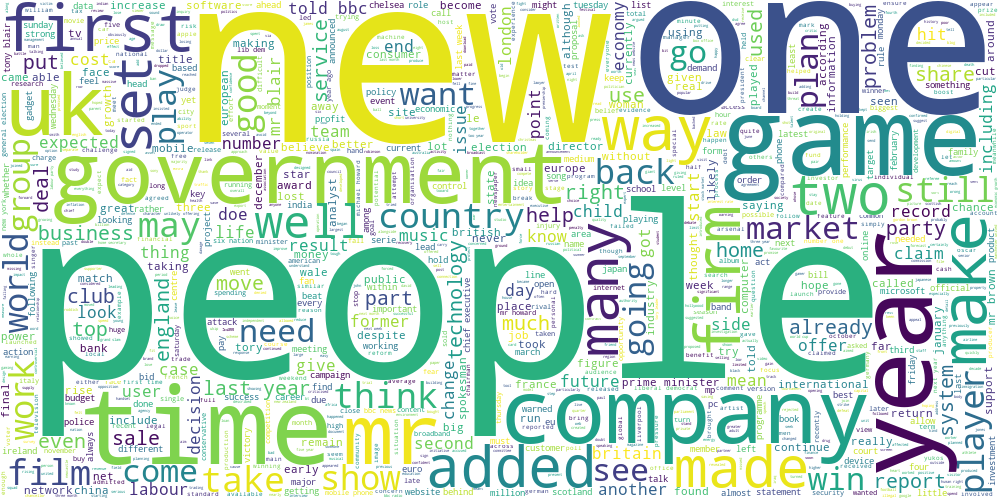

In [44]:
draw_wordcloud(data.text)

**Задание 2.1 (1 балл).** Обучите алгоритм K-Means на tf-idf представлениях текстов. При обучении tf-idf векторайзера рекомендуется отбрасывать редко встречающиеся слова, а также воздержитесь от использования N-грамм. Возьмите не очень большое число кластеров, чтобы было удобно интерпретировать получившиеся темы (например, `n_clusters` = 8). Постройте облака тегов для текстов из разных кластеров. Получились ли темы интерпретируемыми? Попробуйте озаглавить каждую тему.


In [531]:
vectorizer = TfidfVectorizer()
vectorizer = vectorizer.fit(data['text'])
tfidf = vectorizer.transform(data['text'])

kmeans = KMeans(n_clusters=6).fit(tfidf)

In [142]:
data['cluster'] = kmeans.predict(tfidf)

Ну, возьмем 6 каких-то рандомных текстов из разных кластеров и построим облака слов. Параллельно будем пытаться как-то озаглавить каждую тему.

In [143]:
cl_0 = data.loc[data['cluster'] == 0]
cl_1 = data.loc[data['cluster'] == 1]
cl_2 = data.loc[data['cluster'] == 2]
cl_3 = data.loc[data['cluster'] == 3]
cl_4 = data.loc[data['cluster'] == 4]
cl_5 = data.loc[data['cluster'] == 5]

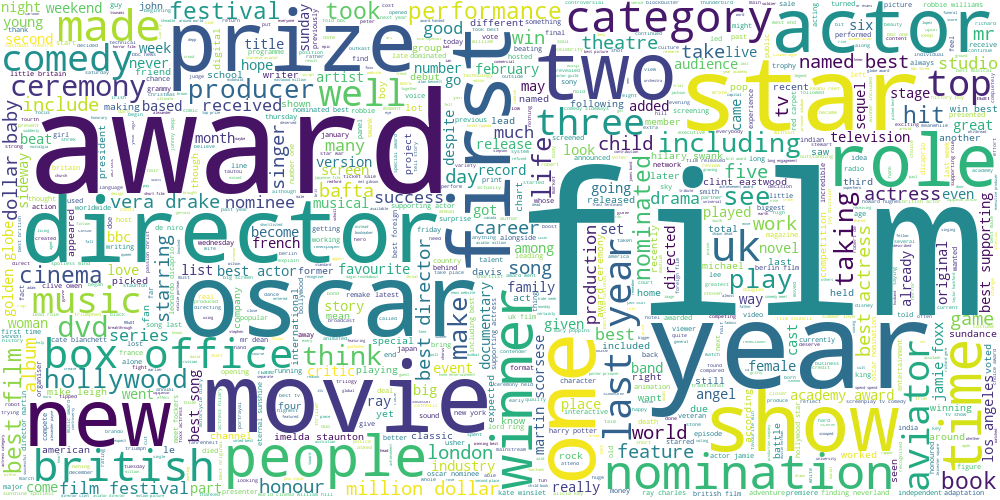

In [201]:
draw_wordcloud(cl_0.text)

Тут надо как-то красиво объединить в названии кино и музыку. Гугл сказал, что это можно назвать "Искусство". Ну, бог с ним

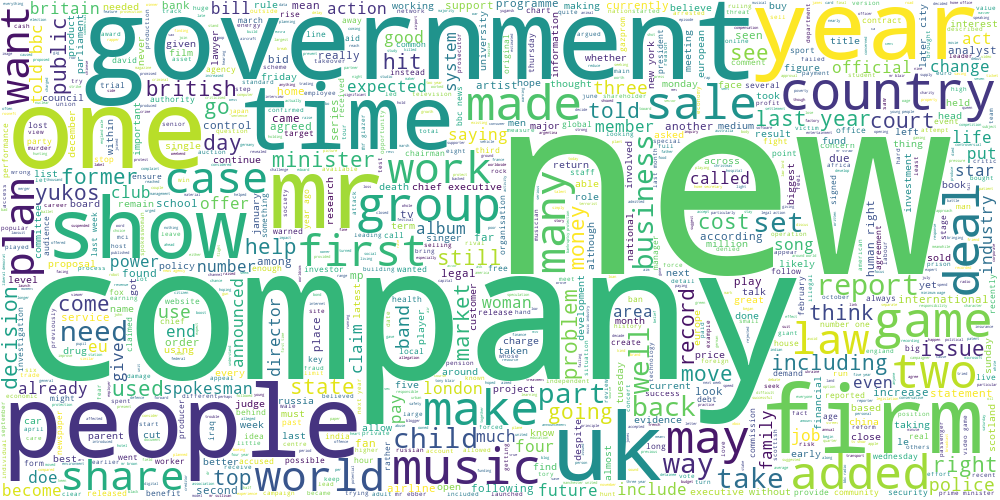

In [202]:
draw_wordcloud(cl_1.text)

Назовем это "Экономика"

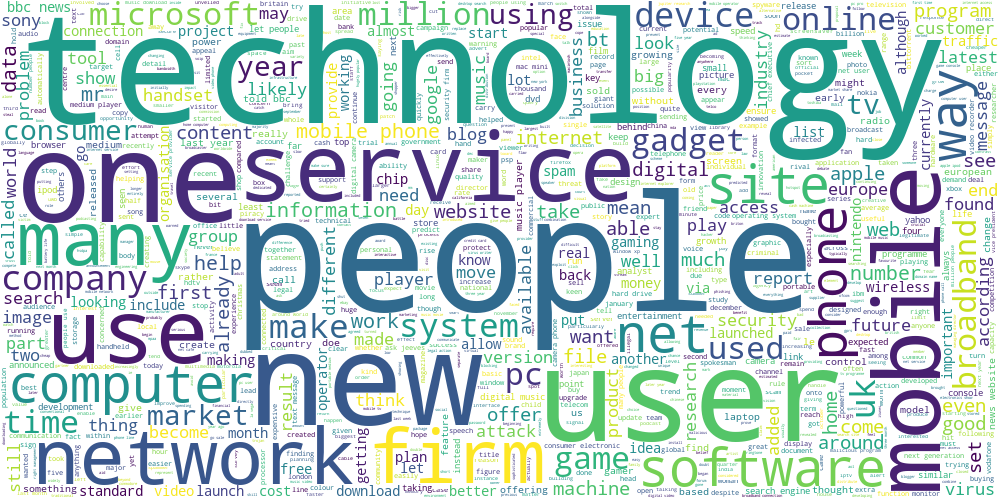

In [203]:
draw_wordcloud(cl_2.text)

О, ну это можно назвать "Технологии"

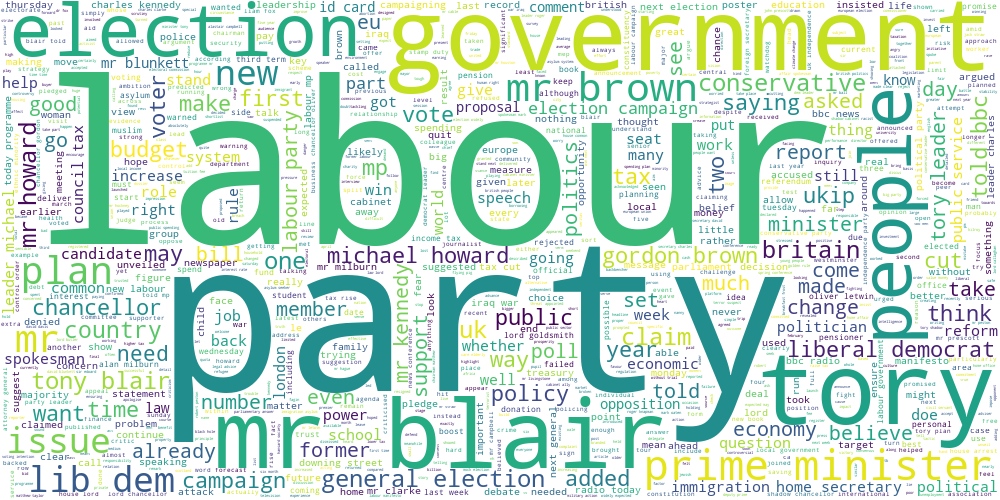

In [204]:
draw_wordcloud(cl_3.text)

Вот тут уже что-то странное. Труд, вечеринки, выборы и правительство...Если б не жирное "party" это можно было бы назвать "Политика". Но вечеринка все портит... (если б слова "government" и "party" были одного размера, то вопросов к "government party" у меня бы не было... а так есть)

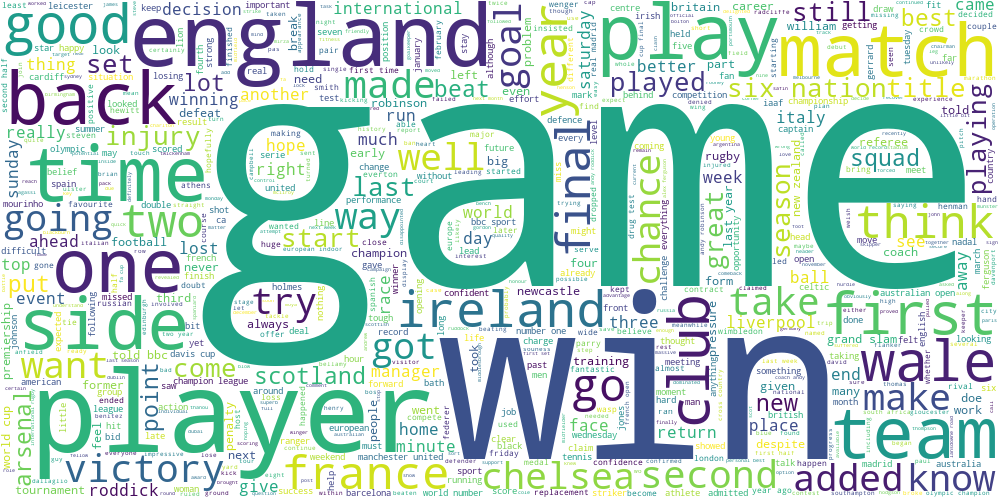

In [205]:
draw_wordcloud(cl_4.text)

Это выглядит как что-то похожее на "Спорт"

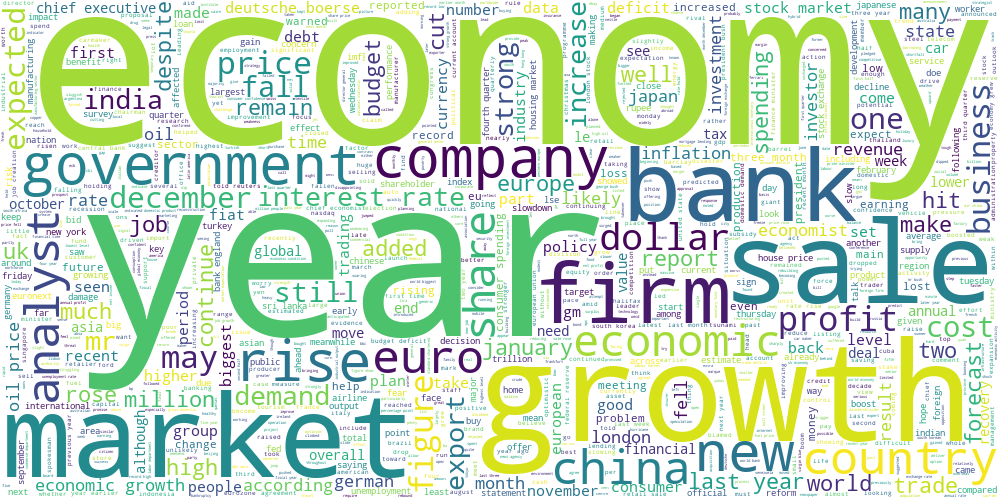

In [206]:
draw_wordcloud(cl_5.text)

Кажется, у меня будет 2 кластера с одним названием. Но сюда тоже подходит "Экономика"... Причем больше, чем нулевому кластеру(

Сказали попробовать озаглавить темы... Я попробовала, не получилось. В целом не всегда все слова были в одной тематике. Ну никто, конечно, не идеален, kmeans тоже. Но вообще вышло +- интерпретируемо.

**Задание 2.2 (0.5 балла).** Попробуем другой способ выделить ключевые слова для каждой темы. Помимо непосредственного разбиения объектов алгоритм K-Means получает центр каждого кластера. Попробуйте взять центры кластеров и посмотреть на слова, для которых значения соответствующих им признаков максимальны. Согласуются ли полученные слова с облаками тегов из прошлого задания?


In [200]:
order_centroids = kmeans.cluster_centers_.argsort()[:, ::-1]
terms = vectorizer.get_feature_names()
for i in range(6):
    print("Кластер %d:" % i, end='\n')
    for ind in order_centroids[i, :5]:
        print('%s' % terms[ind], end='')
        print()
    print()

Кластер 0:
mobile
phone
people
technology
user

Кластер 1:
music
show
band
mr
album

Кластер 2:
game
england
player
win
match

Кластер 3:
company
bank
economy
growth
market

Кластер 4:
film
award
best
oscar
actor

Кластер 5:
mr
labour
election
party
blair



Так, ну вот что-то такое вышло. В целом темы кластеров сохранились. У нас так же есть "Технологии", "Искусство", "Спорт", "Экономика", "Политика". Только теперь вместо двух кластеров, подходящих под название "Экономика" появилось 2 кластера, подходящих под "Искусство". Так что да, полученные слова вполне себе согласуются с облаками тегов из предыдущего пункта.

**Задание 2.3 (1.5 балла).** В первой части мы сравнили три разных алгоритма кластеризации на географических данных. Проделаем то же самое для текстовых данных (в качестве признакого описания снова используем tf-idf). Получите три разбиения на кластеры с помощью алгоритмов K-Means, DBSCAN и спектральной кластеризации (на этот раз воспользуйтесь реализацией из `sklearn`). Для K-Means и спектральной кластеризации возьмите одинаковое небольшое число кластеров, подберите параметр `eps` метода DBSCAN так, чтобы получить приблизительно такое же число кластеров.

Далее, обучите двухмерные t-SNE представления над tf-idf признаками текстов. Визуализируйте эти представления для каждого алгоритма, раскрасив каждый кластер своим цветом. Лучше всего расположить визуализации на одном графике на трех разных сабплотах. Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).

In [539]:
clust_sp = SpectralClustering(n_clusters=6).fit(tfidf).labels_
clust_km = KMeans(n_clusters=6).fit(tfidf).predict(tfidf)

In [540]:
clust_db = DBSCAN(eps=1.27).fit(tfidf).labels_
print(np.unique(clust_db))

[-1  0  1  2  3  4  5]


Опа, eps для DBSCAN подобрали

In [534]:
tsne = TSNE(n_components=2).fit_transform(tfidf)

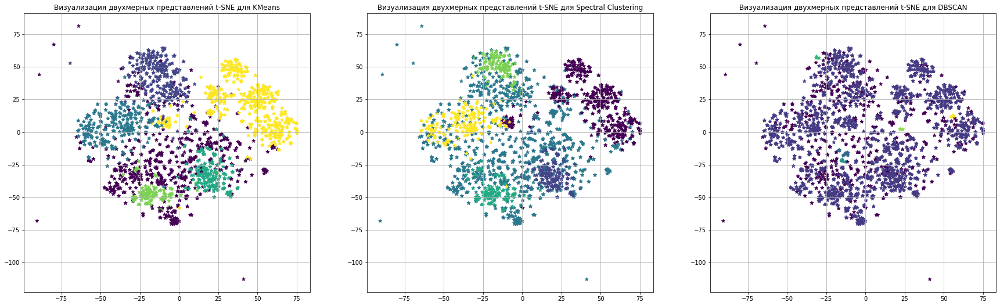

In [541]:
total_axes = 3
plt.figure(figsize=(30, 30))

plt.subplot(total_axes, 3, 1, title='Визуализация двухмерных представлений t-SNE для KMeans')
plt.scatter(tsne[:, 0], tsne[:, 1], marker="*", c=clust_km)
plt.grid()
plt.subplot(total_axes, 3, 2, title='Визуализация двухмерных представлений t-SNE для Spectral Clustering')
plt.scatter(tsne[:, 0], tsne[:, 1], marker="*", c=clust_sp)
plt.grid()
plt.subplot(total_axes, 3, 3, title='Визуализация двухмерных представлений t-SNE для DBSCAN')
plt.scatter(tsne[:, 0], tsne[:, 1], marker="*", c=clust_db)
plt.grid()


Прокомментируйте получившиеся результаты. Какой баланс кластеров получился у разных методов? Соотносятся ли визуализации для текстов с визуализациями для географических данных?

**Ответ:**

Какой-то у нас для DBSCAN вышел, если честно( Я прям расстроена. Баланс кластеров вышел из чата - два кластера явно предобладают над остальными тремя. А так в целом, по виду кажется, что у KMeans и Spectral Clustering качество кластеризации вышло примерно одинаковым. Плюс классы вышли вполне себе сбалансированными.

По поводу того, соотносится ли визуализация с визуализацией для географических данных - не совсем. Мы видим, что у DBSCAN все те же проблемы с маленьким числом кластеров, но при этом результаты работы KMeans и спектральной кластеризации уже вышли немного другими. Во-первых у KMeans кластеры уже не настолько сосредоточены (внутрикластерное расстояние побольше), но это вполне объяснимо, так как мы все-таки кластеризуем тексты, тема которых иногда не полностью однозначна. Результат работы спектральной кластеризации в целом похож на результат для остановок. Но тут еще надо сделать сноску по поводу того, что мы использовали не свой класс, а библиотечный. 

**Задание 2.4 (1.5 балла).** Обучите модель латентного размещения Дирихле. Не забудьте, что она работает с мешком слов, а не с tf-idf признаками. Придумайте, как превратить распределение тем для текста в номер его кластера. Возьмите параметр `n_components` в 2-3 раза больше, чем число кластеров для K-Means. Получились ли темы более узкими от такого нововведения? Постройте облака тегов для нескольких наиболее удачных тем. 


In [138]:
vectorizer = CountVectorizer()  #используем вот такую вот штучку для получения мешка слов
X = vectorizer.fit_transform(data.text)

In [139]:
lda = LatentDirichletAllocation(n_components=15)
lda = lda.fit(X)

lda_res = lda.transform(X)
ida_km = KMeans(n_clusters=5).fit(lda_res).predict(lda_res)

In [140]:
data['ida_cluster'] = ida_km

In [141]:
cl_0 = data.loc[data['ida_cluster'] == 0]
cl_1 = data.loc[data['ida_cluster'] == 1]
cl_2 = data.loc[data['ida_cluster'] == 2]
cl_3 = data.loc[data['ida_cluster'] == 3]
cl_4 = data.loc[data['ida_cluster'] == 4]
cl_5 = data.loc[data['ida_cluster'] == 5]

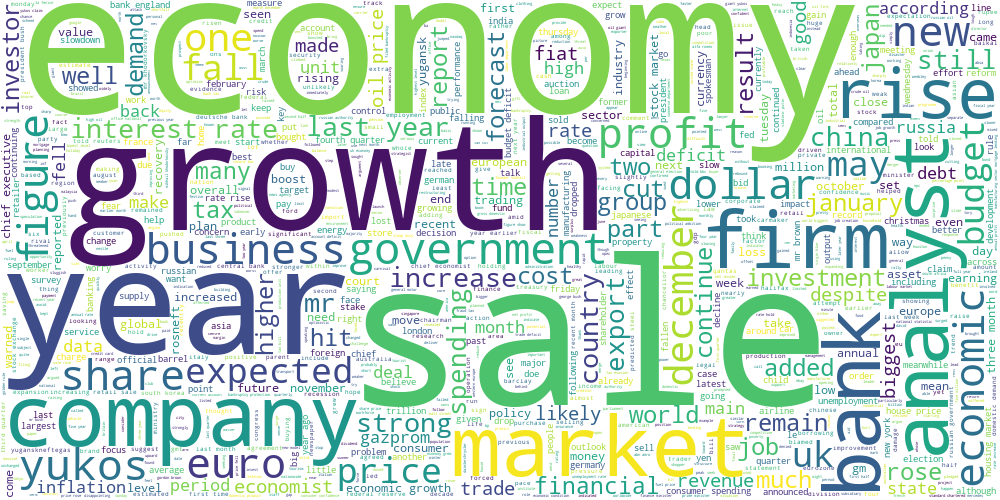

In [142]:
draw_wordcloud(cl_0.text)

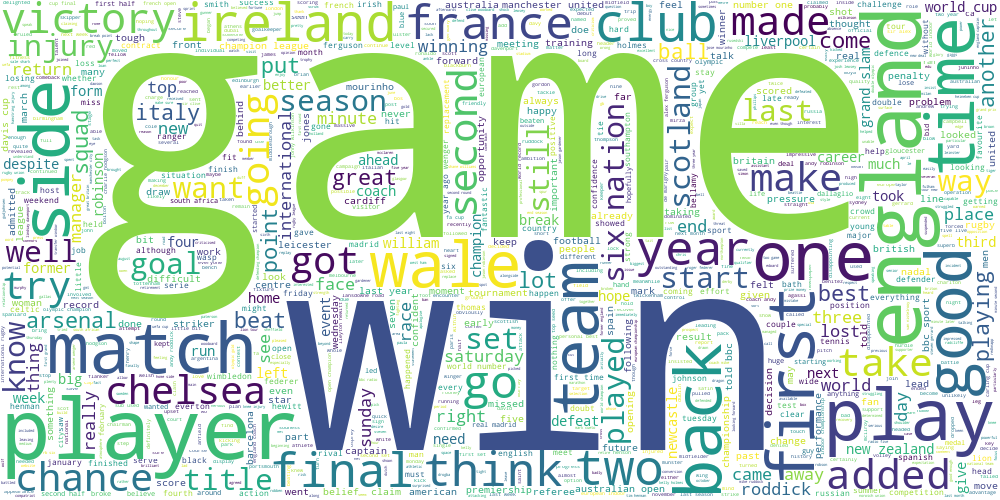

In [146]:
draw_wordcloud(cl_1.text)

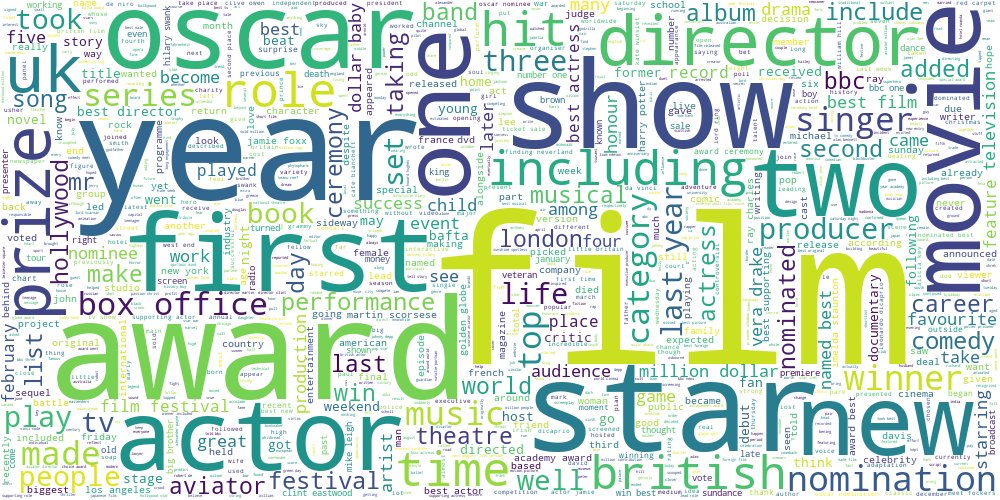

In [143]:
draw_wordcloud(cl_2.text)

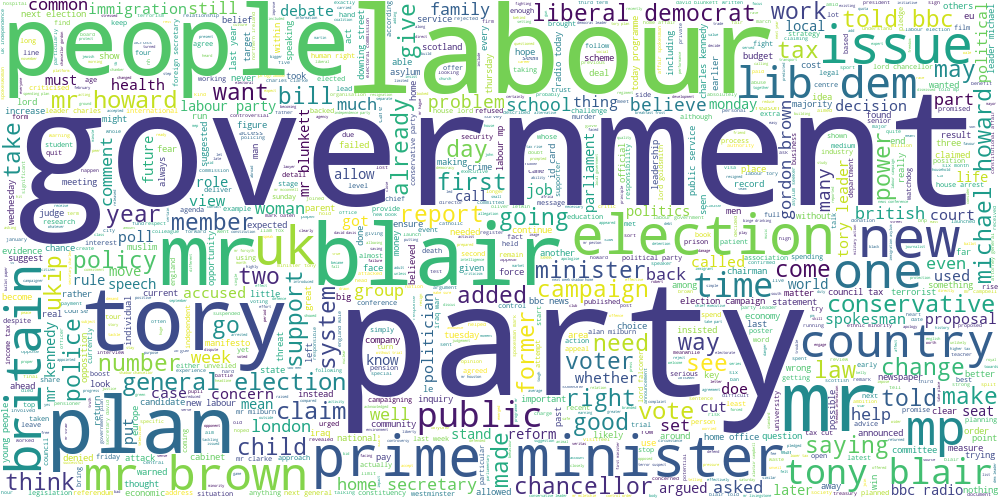

In [144]:
draw_wordcloud(cl_3.text)

Теперь тут "government party" как одна фраза. И наконец то ничего не противоречит теме "Политика"

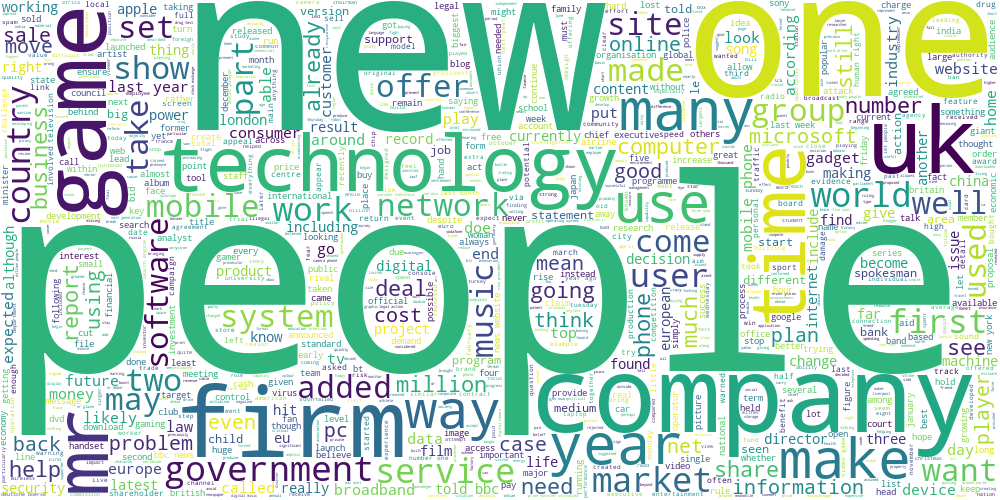

In [145]:
draw_wordcloud(cl_4.text)

Как мы можем заметить (как минимум по тому, что самые большие слова в облаке слов стали еще больше) темы стали немного более узкими. И наша модель более хорошо кластеризует тексты в целом.  
(Теперь тему текстов почти можно назвать по самому крупному слову в облаке слов :))) )



## Часть 3. Transfer learning для задачи классификации текстов

**Задание 3.1 (0.5 балла).** Вспомним, что у нас есть разметка для тематик статей. Попробуем обучить классификатор поверх unsupervised-представлений для текстов. Рассмотрите три модели:

* Логистическая регрессия на tf-idf признаках
* K-Means на tf-idf признаках + логистическая регрессия на расстояниях до центров кластеров
* Латентное размещение Дирихле + логистическая регрессия на вероятностях тем

Разделите выборку на обучающую и тестовую, замерьте accuracy на обоих выборках для всех трех моделей. Параметры всех моделей возьмите равными значениям по умолчанию.

In [548]:
X_train, X_test, y_train, y_test = train_test_split(data.drop(columns=['category']), data['category'], test_size=0.2, random_state=42)

In [240]:
vectorizer_1 = TfidfVectorizer()
model_1 = LogisticRegression()
model_1 = model_1.fit(vectorizer_1.fit_transform(X_train['text']), y_train)
pred_1 = model_1.predict(vectorizer_1.transform(X_test['text']))
pred_1_tr = model_1.predict(vectorizer_1.transform(X_train['text']))

In [242]:
print('Accuracy для логистической регрессии на tf-idf признаках для тестовой выборки =', accuracy_score(pred_1, y_test))
print('Accuracy для логистической регрессии на tf-idf признаках для обучающей выборки =', accuracy_score(pred_1_tr, y_train))

Accuracy для логистической регрессии на tf-idf признаках для тестовой выборки = 0.9685393258426966
Accuracy для логистической регрессии на tf-idf признаках для обучающей выборки = 0.9977528089887641


In [265]:
vectorizer_2 = TfidfVectorizer()
tr_tr = vectorizer_2.fit_transform(X_train['text'])
tr_t = vectorizer_2.transform(X_test['text'])

kmeans = KMeans()
res_tr = kmeans.fit_transform(tr_tr)
res_t = kmeans.transform(tr_t)

model_2 = LogisticRegression()
model_2 = model_2.fit(res_tr, y_train)
pred_2 = model_2.predict(res_t)
pred_2_tr = model_2.predict(res_tr)

In [266]:
print('Accuracy для логистической регрессии на расстояниях до центров кластеров для тестовой выборки =', accuracy_score(pred_2, y_test))
print('Accuracy для логистической регрессии на расстояниях до центров кластеров для обучающей выборки =', accuracy_score(pred_2_tr, y_train))

Accuracy для логистической регрессии на расстояниях до центров кластеров для тестовой выборки = 0.8449438202247191
Accuracy для логистической регрессии на расстояниях до центров кластеров для обучающей выборки = 0.8325842696629213


Кажется, что качество вышло похуже из-за того, что мы применяем логистическую регрессию поверх kmeans, который в данной случае работает не идеально, выделяя сферические кластеры. Ну и в целом как по мне логистическая регрессия на расстояниях до центров класстеров звучит не слишком хорошо. 

In [268]:
vectorizer_3 = CountVectorizer()  #используем вот такую вот штучку для получения мешка слов
X_tr = vectorizer_3.fit_transform(X_train['text'])
X_t = vectorizer_3.transform(X_test['text'])

lda = LatentDirichletAllocation()
lda_tr = lda.fit_transform(X_tr)
lda_t = lda.transform(X_t)

model_3 = LogisticRegression()
model_3 = model_3.fit(X_tr, y_train)
pred_3 = model_3.predict(X_t)
pred_3_tr = model_3.predict(X_tr)

In [270]:
print('Accuracy для логистической регрессии на вероятностях тем для тестовой выборки =', accuracy_score(pred_3, y_test))
print('Accuracy для логистической регрессии на вероятностях тем для обучающей выборки =', accuracy_score(pred_3_tr, y_train))

Accuracy для логистической регрессии на вероятностях тем для тестовой выборки = 0.9617977528089887
Accuracy для логистической регрессии на вероятностях тем для обучающей выборки = 1.0


Как мы можем видеть, тут модель слишком подогналась под обучающую выборку и произошло переобучение. Но при этом данный метод дал довольно хорошее качества, так как логистическая регрессия на вероятностях тем звучит уже более осмысленно и в данном случае применение логистической регрессии поверх lda помогает улучшить качество модели. 

У какой модели получилось лучшее качество?

**Ответ:**

Лучшее качество на тестовой выборке получилось у первой модели, то есть просто у логистической регрессии на tf-idf признаках. Лучшее качество на обучающей выборке вышло у третьей модели - у логистической регрессии на вероятностях тем (поверх LDA). 



**Задание 3.2 (1.5 балла).** Теперь просимулируем ситуацию слабой разметки, которая часто встречается в реальных данных. Разделим обучающую выборку в пропорции 5:65:30. Будем называть части, соответственно, размеченный трейн, неразмеченный трейн и валидация.

Все unsupervised-алгоритмы (векторайзеры и алгоритмы кластеризации) запускайте на всем трейне целиком (размеченном и неразмеченном, суммарно 70%), а итоговый классификатор обучайте только на размеченном трейне (5%). Подберите гиперпараметры моделей по качеству на валидации (30%), а затем оцените качество на тестовой выборке (которая осталась от прошлого задания). Не скромничайте при подборе числа кластеров, сейчас нас интересует не интерпретируемое разбиение выборки, а итоговое качество классификации. 

In [585]:
X_m, X_nm, y_m, y_nm = train_test_split(X_train, y_train, train_size=0.05, random_state=42)

In [586]:
X_nm, X_val, y_nm, y_val = train_test_split(X_nm, y_nm, train_size=0.6845, random_state=42)

In [330]:
train_x = pd.concat([X_m, X_nm])
train_y = pd.concat([y_m, y_nm])

In [342]:
from sklearn.model_selection import GridSearchCV

In [367]:
vectorizer_12 = TfidfVectorizer()
vectorizer_12 = vectorizer_12.fit(train_x['text'])

parameters = {'C':np.linspace(0.0001, 4, 10)}
model_12 = LogisticRegression()
clf = GridSearchCV(model_12, parameters)
clf.fit(vectorizer_12.transform(X_val['text']), y_val)
b_p = clf.best_params_

model_12 = LogisticRegression(C=b_p['C']).fit(vectorizer_12.transform(train_x['text']), train_y)
pred_12_t = model_12.predict(vectorizer_12.transform(X_test['text']))

In [368]:
print('Accuracy для логистической регрессии на tf-idf признаках для тестовой выборки =', accuracy_score(pred_12_t, y_test))

Accuracy для логистической регрессии на tf-idf признаках для тестовой выборки = 0.9685393258426966


Так, ну тут качество не изменилось, видимо подборщик гиперпараметров из меня такой себе

Я че-то не очень андерстенд, как подбирать количество кластеров и C в логистической регрессии одновременно, так что сори за быдлокод

In [369]:
vectorizer_22 = TfidfVectorizer().fit(train_x['text'])
tr_tr = vectorizer_22.fit_transform(train_x['text'])
tr_val = vectorizer_22.transform(X_val['text'])
tr_t = vectorizer_22.transform(X_test['text'])

best_acc = 0
best_num_cl = 0
best_c = 0

for i in range(8, 20): 
    kmeans = KMeans(n_clusters=i)
    res_tr = kmeans.fit_transform(tr_tr)
    res_val = kmeans.transform(tr_val)
    res_t = kmeans.transform(tr_t)

    parameters = {'C':np.linspace(0.001, 4, 4)}
    model_22 = LogisticRegression()
    clf = GridSearchCV(model_22, parameters)
    clf.fit(res_val, y_val)
    b_p = clf.best_params_
    model_22 = LogisticRegression(C=b_p['C']).fit(res_tr, train_y)
    pred_22 = model_22.predict(res_val)
    if accuracy_score(pred_22, y_val) > best_acc:
        best_acc = accuracy_score(pred_22, y_val) 
        best_num_cl = i
        best_c = b_p['C']

In [370]:
kmeans = KMeans(n_clusters=best_num_cl)
res_tr = kmeans.fit_transform(tr_tr)
res_val = kmeans.transform(tr_val)
res_t = kmeans.transform(tr_t)

model_22 = LogisticRegression(C=best_c)
model_22 = model_22.fit(res_tr, train_y)
pred_22_t = model_22.predict(res_t)

In [374]:
print('Accuracy для логистической регрессии на расстояниях до центров кластеров для тестовой выборки =', accuracy_score(pred_22_t, y_test))

Accuracy для логистической регрессии на расстояниях до центров кластеров для тестовой выборки = 0.8808988764044944


Тут качество возрасло по сравнению с моделью на всех размеченных данных

In [391]:
vectorizer_32 = CountVectorizer() 
X_tr = vectorizer_32.fit_transform(train_x['text'])
X_t = vectorizer_32.transform(X_test['text'])
X_val = vectorizer_32.transform(X_val['text'])

best_acc = 0
best_num_cl = 0
best_c = 0

for i in range(15, 25):
    lda = LatentDirichletAllocation(n_components=i)
    lda_tr = lda.fit_transform(X_tr)
    lda_t = lda.transform(X_t)
    lda_val = lda.transform(X_val)

    parameters = {'C':np.linspace(0.001, 4, 4)}
    model_32 = LogisticRegression()
    clf = GridSearchCV(model_32, parameters)
    clf.fit(lda_val, y_val)
    b_p = clf.best_params_
    model_32 = LogisticRegression(C=b_p['C']).fit(lda_tr, train_y)
    pred_32 = model_32.predict(lda_val)
    if accuracy_score(pred_32, y_val) > best_acc:
        best_acc = accuracy_score(pred_32, y_val) 
        best_num_cl = i
        best_c = b_p['C']

In [392]:
lda = LatentDirichletAllocation(n_components=best_num_cl)
lda_tr = lda.fit_transform(X_tr)
lda_t = lda.transform(X_t)
lda_val = lda.transform(X_val)

model_32 = LogisticRegression(C=best_c)
model_32 = model_32.fit(res_tr, train_y)
pred_32_t = model_32.predict(res_t)

In [393]:
print('Accuracy для логистической регрессии на вероятностях тем для тестовой выборки =', accuracy_score(pred_32_t, y_test))

Accuracy для логистической регрессии на вероятностях тем для тестовой выборки = 0.8359550561797753


А тут качество упало, причем довольно сильно( Печально

**Выводы:**

Да а что тут можно сказать. В среднем качество моделей упало, что было ожидаемо из-за малого количества размеченных данных. Лучше всего с такой ситуацией справился (имеется ввиду то, что качество возрасло в сравнении с обучением на всех размеченных данных) второй метод - логистическая регрессия на расстояниях от центров кластеров.

Вывод: в жизни все намного более грустно, чем в наших синтетических расчетах.

## Бонус

**Задание 4 (1 балл)**. Разберитесь с semi-supervised методами, которые реализованы в `sklearn` и примените их к заданию 3.2. Получилось ли добиться лучшего качества? Сделайте выводы.

In [546]:
#from sklearn.semi_supervised import SelfTrainingClassifier
#я пыталась, но он совсем никак не подгружался :с

from sklearn.semi_supervised import LabelPropagation
from sklearn.semi_supervised import LabelSpreading

In [569]:
vectorizer_12 = TfidfVectorizer()
vectorizer_12 = vectorizer_12.fit(train_x['text'])

parameters = {'gamma':np.linspace(1, 30, 30)}
model_12 = LabelPropagation()
clf = GridSearchCV(model_12, parameters)
clf.fit(vectorizer_12.transform(X_val['text']).toarray(), y_val)
b_p = clf.best_params_

model_12 = LabelPropagation(gamma=b_p['gamma']).fit(vectorizer_12.transform(train_x['text']).toarray(), train_y)
pred_12_t = model_12.predict(vectorizer_12.transform(X_test['text']))

print('Accuracy для LabelPropagation на tf-idf признаках для тестовой выборки =', accuracy_score(pred_12_t, y_test))

Accuracy для LabelPropagation на tf-idf признаках для тестовой выборки = 0.9303370786516854


In [567]:
vectorizer_12 = TfidfVectorizer()
vectorizer_12 = vectorizer_12.fit(train_x['text'])

parameters = {'gamma': np.linspace(5, 20, 10), 'alpha':np.linspace(0, 1, 10)}
model_12 = LabelSpreading()
clf = GridSearchCV(model_12, parameters)
clf.fit(vectorizer_12.transform(X_val['text']).toarray(), y_val)
b_p = clf.best_params_

model_12 = LabelSpreading(gamma=b_p['gamma'], alpha=b_p['alpha']).fit(vectorizer_12.transform(train_x['text']).toarray(), train_y)
pred_12_t = model_12.predict(vectorizer_12.transform(X_test['text']))

print('Accuracy для LabelSpreading на tf-idf признаках для тестовой выборки =', accuracy_score(pred_12_t, y_test))

Accuracy для LabelSpreading на tf-idf признаках для тестовой выборки = 0.9348314606741573


Так, ну это в обоих случаях хуже, чем было у логистической регрессии. Есть вероятность, что я просто не умею подбирать гиперпараметры... Но в общем LabelSpreading  справился немного лучше

In [581]:
vectorizer_22 = TfidfVectorizer().fit(train_x['text'])
tr_tr = vectorizer_22.fit_transform(train_x['text'])
tr_val = vectorizer_22.transform(X_val['text'])
tr_t = vectorizer_22.transform(X_test['text'])

best_acc = 0
best_num_cl = 0
best_c = 0

for i in range(8, 15): 
    kmeans = KMeans(n_clusters=i)
    res_tr = kmeans.fit_transform(tr_tr)
    res_val = kmeans.transform(tr_val)
    res_t = kmeans.transform(tr_t)

    parameters = {'gamma': np.linspace(5, 30, 10)}
    model_22 = LabelPropagation()
    clf = GridSearchCV(model_22, parameters)
    clf.fit(res_val, y_val)
    b_p = clf.best_params_
    model_22 = LabelPropagation(gamma=b_p['gamma']).fit(res_tr, train_y)
    pred_22 = model_22.predict(res_val)
    if accuracy_score(pred_22, y_val) > best_acc:
        best_acc = accuracy_score(pred_22, y_val) 
        best_num_cl = i
        best_c = b_p['gamma']

kmeans = KMeans(n_clusters=best_num_cl)
res_tr = kmeans.fit_transform(tr_tr)
res_val = kmeans.transform(tr_val)
res_t = kmeans.transform(tr_t)

model_22 = LabelPropagation(gamma=best_c)
model_22 = model_22.fit(res_tr, train_y)
pred_22_t = model_22.predict(res_t)

print('Accuracy для LabelPropagation на расстояниях до центров кластеров для тестовой выборки =', accuracy_score(pred_22_t, y_test))

Accuracy для LabelPropagation на расстояниях до центров кластеров для тестовой выборки = 0.5797752808988764


In [582]:
vectorizer_22 = TfidfVectorizer().fit(train_x['text'])
tr_tr = vectorizer_22.fit_transform(train_x['text'])
tr_val = vectorizer_22.transform(X_val['text'])
tr_t = vectorizer_22.transform(X_test['text'])

best_acc = 0
best_num_cl = 0
best_c = 0

for i in range(8, 15): 
    kmeans = KMeans(n_clusters=i)
    res_tr = kmeans.fit_transform(tr_tr)
    res_val = kmeans.transform(tr_val)
    res_t = kmeans.transform(tr_t)

    parameters = {'gamma': np.linspace(5, 30, 10)}
    model_22 = LabelSpreading()
    clf = GridSearchCV(model_22, parameters)
    clf.fit(res_val, y_val)
    b_p = clf.best_params_
    model_22 = LabelSpreading(gamma=b_p['gamma']).fit(res_tr, train_y)
    pred_22 = model_22.predict(res_val)
    if accuracy_score(pred_22, y_val) > best_acc:
        best_acc = accuracy_score(pred_22, y_val) 
        best_num_cl = i
        best_c = b_p['gamma']

kmeans = KMeans(n_clusters=best_num_cl)
res_tr = kmeans.fit_transform(tr_tr)
res_val = kmeans.transform(tr_val)
res_t = kmeans.transform(tr_t)

model_22 = LabelSpreading(gamma=best_c)
model_22 = model_22.fit(res_tr, train_y)
pred_22_t = model_22.predict(res_t)

print('Accuracy для LabelSpreading на расстояниях до центров кластеров для тестовой выборки =', accuracy_score(pred_22_t, y_test))

Accuracy для LabelSpreading на расстояниях до центров кластеров для тестовой выборки = 0.5887640449438202


Мда... Ну, LabelSpreading снова справился немного лучше

In [583]:
vectorizer_32 = CountVectorizer() 
X_tr = vectorizer_32.fit_transform(train_x['text'])
X_t = vectorizer_32.transform(X_test['text'])
X_val = vectorizer_32.transform(X_val['text'])

best_acc = 0
best_num_cl = 0
best_c = 0

for i in range(15, 25):
    lda = LatentDirichletAllocation(n_components=i)
    lda_tr = lda.fit_transform(X_tr)
    lda_t = lda.transform(X_t)
    lda_val = lda.transform(X_val)

    parameters = {'gamma': np.linspace(5, 30, 15)}
    model_32 = LabelPropagation()
    clf = GridSearchCV(model_32, parameters)
    clf.fit(lda_val, y_val)
    b_p = clf.best_params_
    model_32 = LabelPropagation(gamma=b_p['gamma']).fit(lda_tr, train_y)
    pred_32 = model_32.predict(lda_val)
    if accuracy_score(pred_32, y_val) > best_acc:
        best_acc = accuracy_score(pred_32, y_val) 
        best_num_cl = i
        best_c = b_p['gamma']

lda = LatentDirichletAllocation(n_components=best_num_cl)
lda_tr = lda.fit_transform(X_tr)
lda_t = lda.transform(X_t)
lda_val = lda.transform(X_val)

model_32 = LabelPropagation(gamma=best_c)
model_32 = model_32.fit(res_tr, train_y)
pred_32_t = model_32.predict(res_t)

print('Accuracy для LabelPropagation на вероятностях тем для тестовой выборки =', accuracy_score(pred_32_t, y_test))

Accuracy для LabelPropagation на вероятностях тем для тестовой выборки = 0.5617977528089888


In [587]:
vectorizer_32 = CountVectorizer() 
X_tr = vectorizer_32.fit_transform(train_x['text'])
X_t = vectorizer_32.transform(X_test['text'])
X_val = vectorizer_32.transform(X_val['text'])

best_acc = 0
best_num_cl = 0
best_c = 0

for i in range(15, 25):
    lda = LatentDirichletAllocation(n_components=i)
    lda_tr = lda.fit_transform(X_tr)
    lda_t = lda.transform(X_t)
    lda_val = lda.transform(X_val)

    parameters = {'gamma': np.linspace(5, 30, 15)}
    model_32 = LabelSpreading()
    clf = GridSearchCV(model_32, parameters)
    clf.fit(lda_val, y_val)
    b_p = clf.best_params_
    model_32 = LabelSpreading(gamma=b_p['gamma']).fit(lda_tr, train_y)
    pred_32 = model_32.predict(lda_val)
    if accuracy_score(pred_32, y_val) > best_acc:
        best_acc = accuracy_score(pred_32, y_val) 
        best_num_cl = i
        best_c = b_p['gamma']

lda = LatentDirichletAllocation(n_components=best_num_cl)
lda_tr = lda.fit_transform(X_tr)
lda_t = lda.transform(X_t)
lda_val = lda.transform(X_val)

model_32 = LabelSpreading(gamma=best_c)
model_32 = model_32.fit(res_tr, train_y)
pred_32_t = model_32.predict(res_t)

print('Accuracy для LabelSpreading на вероятностях тем для тестовой выборки =', accuracy_score(pred_32_t, y_test))

Accuracy для LabelSpreading на вероятностях тем для тестовой выборки = 0.5730337078651685


LabelSpreading дал качество выше, чем LabelPropagation 

Я не знаю, что я сделала не так, что качество такое ужасное. Но чувствую, что еще немного мо и месяц восстановления моей нервной системы станет напрасным. Так что на сегодня с меня хватит. Пойду пить какао и делать вид, что у меня все хорошо и дедлайны не горят.

Но чисто на всякий случай сделаю вывод о том, что данные методы классификации плохо работают с предложенными нам алгоритмами (это не я тупая, это так все и должно было быть, да). Что по логике вещей не должно быть правдой)) Еще можно сделать вывод, что нужно более подробно разбираться с работой методов и читать больше одной статьи о них:) Вывод? Вывод.

**Задание 5 (1 балл)**. На занятиях мы обсуждали, что метрика [BCubed](https://www.researchgate.net/profile/Julio-Gonzalo-2/publication/225548032_Amigo_E_Gonzalo_J_Artiles_J_et_alA_comparison_of_extrinsic_clustering_evaluation_metrics_based_on_formal_constraints_Inform_Retriev_12461-486/links/0c96052138dbb99740000000/Amigo-E-Gonzalo-J-Artiles-J-et-alA-comparison-of-extrinsic-clustering-evaluation-metrics-based-on-formal-constraints-Inform-Retriev-12461-486.pdf) хорошо подходит для сравнения алгоритмов кластеризации, если нам известно настоящее разделение на кластеры (gold standard). Реализуйте подсчет метрики BCubed и сравните несколько алгоритмов кластеризации на текстовых данных из основного задания. В качестве gold standard используйте разметку category.

Код взят отсюда: https://github.com/m-wiesner/BCUBED/blob/master/B3score/b3.py

Мы люди честные

In [600]:
def compute_class_precision_recall(L, K): 
  _,L = np.unique(np.array(L),return_inverse=True)
  _,K = np.unique(np.array(K),return_inverse=True)

  num_elements = len(L)
  num_labels = L.max() + 1
  num_clusters = K.max() + 1

  X_L = np.tile(L, (num_labels,1) ).T
  X_K = np.tile(K, (num_clusters,1)).T

  L_j = np.equal( np.tile(np.arange(num_labels), (num_elements,1)), X_L).astype(float)
  K_j = np.equal( np.tile(np.arange(num_clusters), (num_elements,1)), X_K).astype(float)   

  P_ij = np.dot(L_j.T,K_j) 

  S_i = P_ij.sum(axis=1)
  T_i = P_ij.sum(axis=0)

  R_i = ( P_ij * P_ij).sum(axis=1) / (S_i * S_i)
  P_i = ( P_ij.T * P_ij.T).sum(axis=1) / (T_i * T_i)

  return [(P_i , R_i) , (S_i , T_i)]
 
def calc_b3(L , K , class_norm=False, beta=1.0):
  precision_recall, class_sizes = compute_class_precision_recall(L, K)
  
  if(class_norm == True):
    precision = precision_recall[0].sum() / class_sizes[1].size 
    recall = precision_recall[1].sum() / class_sizes[0].size
  else:
    precision = (precision_recall[0] * class_sizes[1] ).sum() / class_sizes[1].sum()
    recall = (precision_recall[1] * class_sizes[0] ).sum() / class_sizes[0].sum()
  
  f_measure = (1 + beta**2) * (precision * recall) /((beta**2) * precision + recall) 
  
  return [f_measure, precision, recall] 

In [602]:
vectorizer_1 = TfidfVectorizer()
model_1 = LogisticRegression()
model_1 = model_1.fit(vectorizer_1.fit_transform(X_train['text']), y_train)
pred_1 = model_1.predict(vectorizer_1.transform(X_test['text']))
pred_1_tr = model_1.predict(vectorizer_1.transform(X_train['text']))

In [615]:
print('F-мера с метрикой BCUBED для логистической регрессии на tf-idf признаках для тестовой выборки =', calc_b3(pred_1, y_test)[0])
print('F-мера с метрикой BCUBED для логистической регрессии на tf-idf признаках для обучающей выборки =', calc_b3(pred_1_tr, y_train)[0])

F-мера с метрикой BCUBED для логистической регрессии на tf-idf признаках для тестовой выборки = 0.9389673544061484
F-мера с метрикой BCUBED для логистической регрессии на tf-idf признаках для обучающей выборки = 0.9955204789416481


In [608]:
print('Precision, recall для тестовой выборки:', calc_b3(pred_1, y_test)[1:])
print('Precision, recall для обучающей выборки:', calc_b3(pred_1_tr, y_train)[1:])

Precision, recall для тестовой выборки: [0.9388125213317785, 0.9391222385604407]
Precision, recall для обучающей выборки: [0.9955188361517557, 0.9955221217369621]


In [601]:
vectorizer_2 = TfidfVectorizer()
tr_tr = vectorizer_2.fit_transform(X_train['text'])
tr_t = vectorizer_2.transform(X_test['text'])

kmeans = KMeans()
res_tr = kmeans.fit_transform(tr_tr)
res_t = kmeans.transform(tr_t)

model_2 = LogisticRegression()
model_2 = model_2.fit(res_tr, y_train)
pred_2 = model_2.predict(res_t)
pred_2_tr = model_2.predict(res_tr)

In [610]:
print('F-мера с метрикой BCUBED для логистической регрессии на расстояниях до центров кластеров для тестовой выборки =', calc_b3(pred_2, y_test)[0])
print('F-мера с метрикой BCUBED для логистической регрессии на расстояниях до центров кластеров для обучающей выборки =', calc_b3(pred_2_tr, y_train)[0])

F-мера с метрикой BCUBED для логистической регрессии на расстояниях до центров кластеров для тестовой выборки = 0.7102471336578641
F-мера с метрикой BCUBED для логистической регрессии на расстояниях до центров кластеров для обучающей выборки = 0.7070522323083668


In [611]:
print('Precision, recall для тестовой выборки:', calc_b3(pred_2, y_test)[1:])
print('Precision, recall для обучающей выборки:', calc_b3(pred_2_tr, y_train)[1:])

Precision, recall для тестовой выборки: [0.7248292583859622, 0.6962401646994546]
Precision, recall для обучающей выборки: [0.718983325313569, 0.6955106540718734]


In [612]:
vectorizer_3 = CountVectorizer() 
X_tr = vectorizer_3.fit_transform(X_train['text'])
X_t = vectorizer_3.transform(X_test['text'])

lda = LatentDirichletAllocation()
lda_tr = lda.fit_transform(X_tr)
lda_t = lda.transform(X_t)

model_3 = LogisticRegression()
model_3 = model_3.fit(X_tr, y_train)
pred_3 = model_3.predict(X_t)
pred_3_tr = model_3.predict(X_tr)

In [613]:
print('F-мера с метрикой BCUBED для логистической регрессии на вероятностях тем для тестовой выборки =', calc_b3(pred_3, y_test)[0])
print('F-мера с метрикой BCUBED для логистической регрессии на вероятностях тем для обучающей выборки =', calc_b3(pred_3_tr, y_train)[0])

F-мера с метрикой BCUBED для логистической регрессии на вероятностях тем для тестовой выборки = 0.9266801858216106
F-мера с метрикой BCUBED для логистической регрессии на вероятностях тем для обучающей выборки = 1.0


In [614]:
print('Precision, recall для тестовой выборки:', calc_b3(pred_3, y_test)[1:])
print('Precision, recall для обучающей выборки:', calc_b3(pred_3_tr, y_train)[1:])

Precision, recall для тестовой выборки: [0.9266497398846408, 0.9267106337593051]
Precision, recall для обучающей выборки: [1.0, 1.0]


Вот как-то так и получилось... Можем заметить, что ранжирование алгоритмов между собой у нас не поменялось. Все также лучшим стал первый метод с логистической регрессией на tf-idf преобразованных признаках, а худшим второй метод с логистической регрессией на расстояниях до центров кластеров. 

Вроде выводов тут особо не просили.

**Задание 6 (2 баллa)**. Спектральная кластеризация, по сути, является обычной кластеризацией KMeans поверх эмбеддингов объектов, которые получаются из лапласиана графа. А что, если мы попробуем построить эмбеддинги каким-нибудь другим способом? В этом задании мы предлагаем вам проявить немного фантазии. Возьмите какие-нибудь данные высокой размерности, чтобы задача обучения эмбеддингов имела смысл (например, картинки или тексты, желательно выбрать что-нибудь оригинальное). Придумайте или найдите какой-нибудь метод обучения эмбеддингов, примените его к данным и кластеризуйте полученные представления. Если чувствуете в себе достаточно силы, можете попробовать что-нибудь нейросетевое. Сравните ваш подход с базовыми алгоритмами кластеризации, которое мы рассмотрели в основном задании, не забывайте про визуализации! Ключевые слова для вдохновения: ***KernelPCA***, ***UMAP***, ***autoencoders***, ***gensim***. 

In [ ]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

**Задание 7 (1e-100 балла)**. Опишите свои ощущения от этой домашки, поощряется сравнение с предыдущей.

Ощущения нейтральные, так что я просто оставлю пару тик токов с котиками

https://vm.tiktok.com/ZSJjef6Te/
 
https://vm.tiktok.com/ZSJjeBUta/

Хорошего утра/дня/вечера/ночи тому, кто это проверял ✨✨✨